# <a id='toc1_'></a>[Realtime Inference with SDXL 1.0](#toc0_)
### For AWS GenAI day September 11th 2023

This sample notebook showcases some functionality of Stability's SDXL.

 [Stability SDK documentation](https://api.stability.ai/docs#tag/v1generation)

  
- [1. Set up your Credentials](#toc3_)    
- [2: Perform real-time inference](#toc4_)    
  - [A: Text to image](#toc4_1_) 
  - [B: Style presets](#toc4_2_)    
  - [C: Render text](#toc4_3_)  
  - [D: Image to image](#toc4_4_) 
  - [E: Image to image](#toc4_5_)    



This notebook uses the Stability REST API to generate images

# 1. Set up your credentials

We'll use a temporary API key for the demo.

In [9]:
import base64
import os
import io
import requests
from PIL import Image

engine_id = "stable-diffusion-xl-1024-v1-0"
api_host = "https://staging-api.stability.ai"   # We will use the staging API for this demo
api_key = "sk-cJfE3sFhTK8mTDsrQLOA1ouyeDqK7Vde7ZZw9m5suOwd6HQV"

# <a id='toc4_'></a> Perform realtime inference

## <a id='toc4_1_'></a>[A: Text to image](#toc0_)

We'll start by running a generation request. For the full list of parameters, [see the Stability.ai SDK documentation.](https://api.stability.ai/docs#tag/v1generation)



In [3]:
response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/text-to-image",
    headers={
        "Content-Type": "application/json",
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    json={
    "text_prompts": [
        {
            "text": "jaguar in the Amazon rainforest"
        }
    ],
        "seed": 12345,

    },
)

Output images are included in the response's `artifacts` as base64 encoded strings. Below is a helper function for accessing decoding these images:

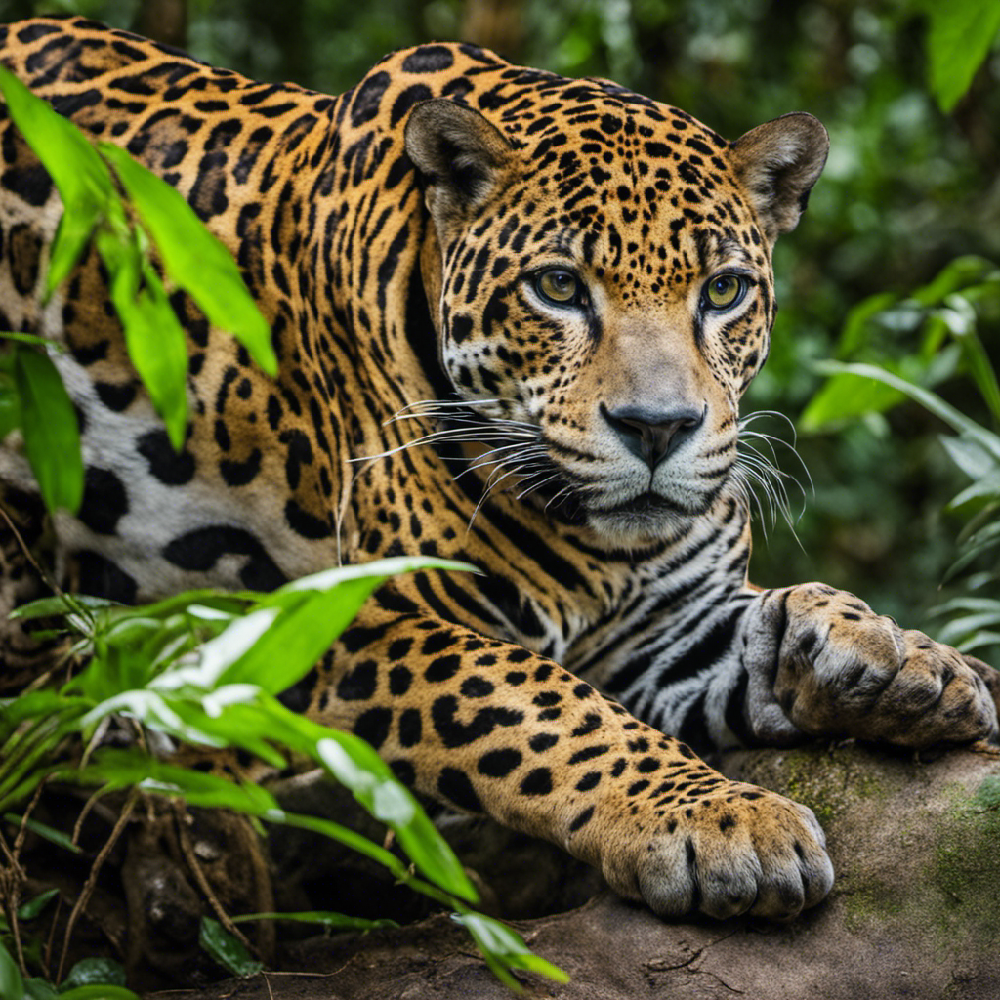

In [10]:
def decode_and_show(model_response: requests.models.Response) -> None:
    """
    Decodes and displays an image from SDXL output

    Args:
        model_response (GenerationResponse): The response object from the deployed SDXL model.

    Returns:
        None
    """
    # image = model_response.artifacts[0].base64
    data = model_response.json()
    for i, image in enumerate(data["artifacts"]):
        image_data = base64.b64decode(image["base64"])
        image = Image.open(io.BytesIO(image_data))
        display(image)

decode_and_show(response)



Now let's experiment with a different image resolution. SDXL supports a fixed set of resolutions, that include formats suitable for webpage banners, portraits and other assets.

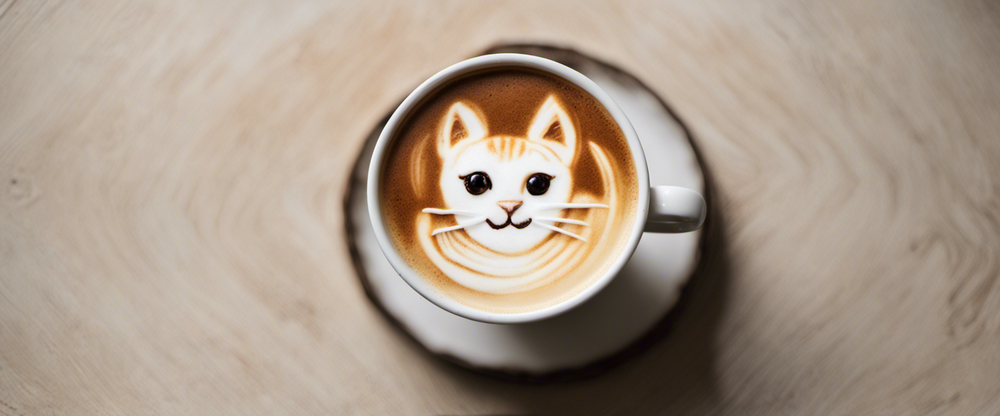

In [12]:
text = "photograph of latte art of a cat"

response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/text-to-image",
    headers={
        "Content-Type": "application/json",
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    json={
    "text_prompts": [
        {
            "text": text
        }
    ],
        "seed": 5,
        "height": 640,
        "width": 1536

    },
)

decode_and_show(response)

## <a id='toc4_2_'></a>[B: Style presets](#toc0_)

Let's try passing in a `style_preset`. 

The available style presets are:

`3d-model`, `analog-film`, `anime`, `cinematic`, `comic-book`, `digital-art`, `enhance`, `fantasy-art`, `isometric`, `line-art`, `low-poly`, `modeling-compound`, `neon-punk`, `origami`, `photographic`, `pixel-art`, `tile-texture`.



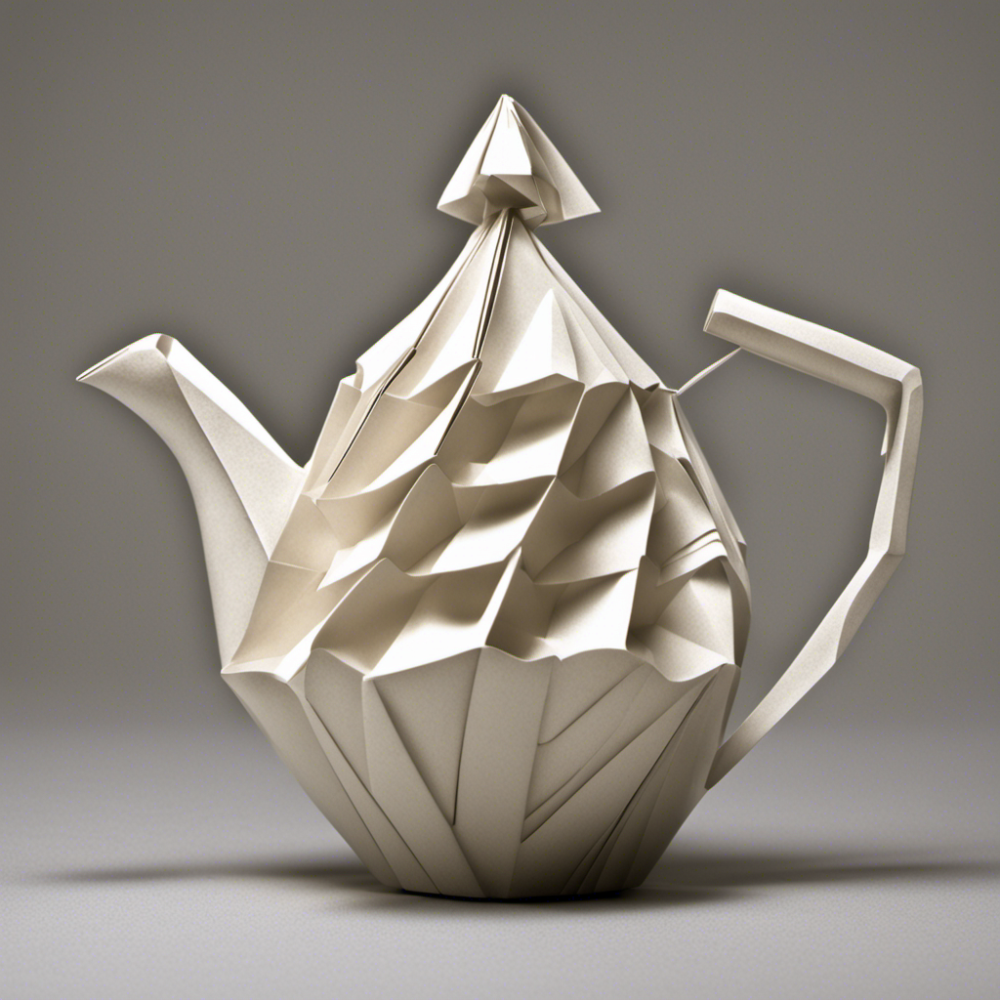

In [13]:
# origami preset

response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/text-to-image",
    headers={
        "Content-Type": "application/json",
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    json={
    "text_prompts": [
        {
            "text": "teapot"
        }
    ],
        "seed": 3,
        "height": 1024,
        "width": 1024,
        "style_preset": "origami"

    },
)


decode_and_show(response)


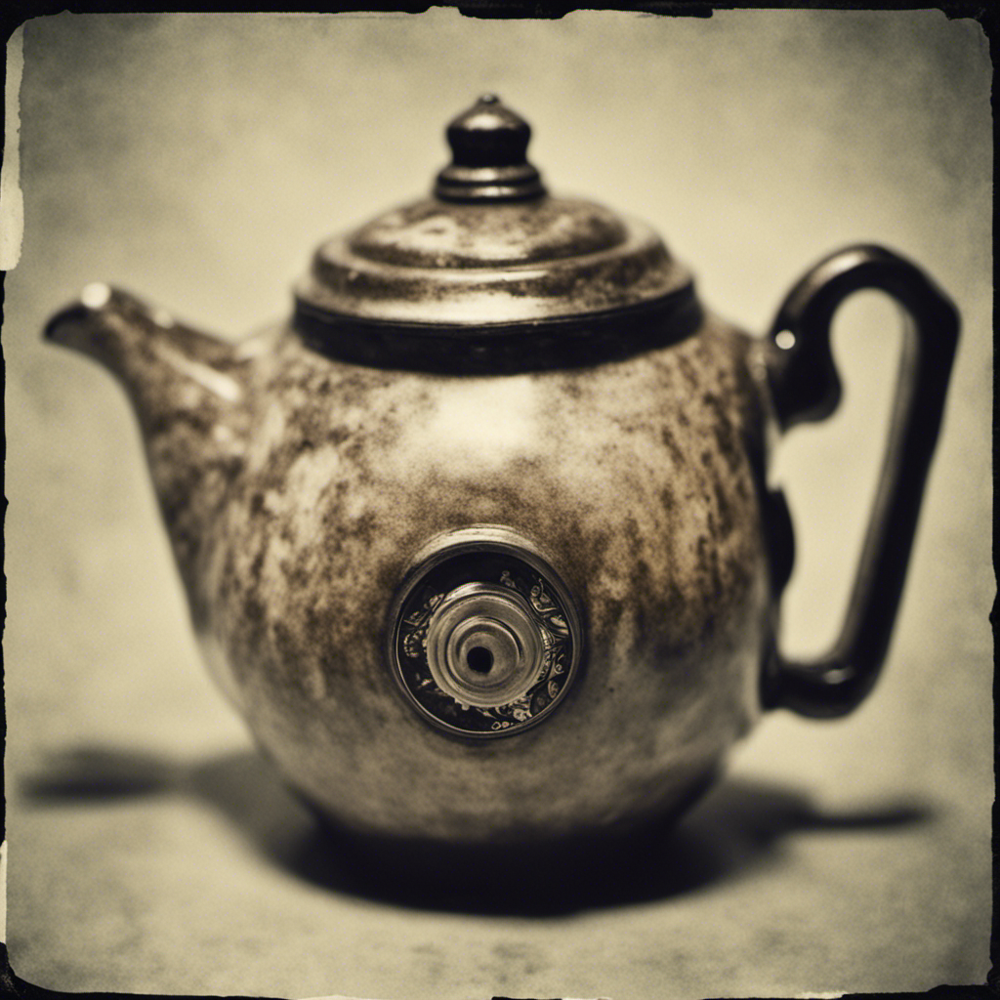

In [19]:
# analogue film preset

response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/text-to-image",
    headers={
        "Content-Type": "application/json",
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    json={
    "text_prompts": [
        {
            "text": "teapot"
        }
    ],
        "seed": 7,
        "height": 1024,
        "width": 1024,
        "style_preset": "analog-film"

    },
)


decode_and_show(response)

## <a id='toc4_3_'></a>[C: Render Text](#toc0_)


SDXL can render short snippets of text, like single words. Let's try an example below.

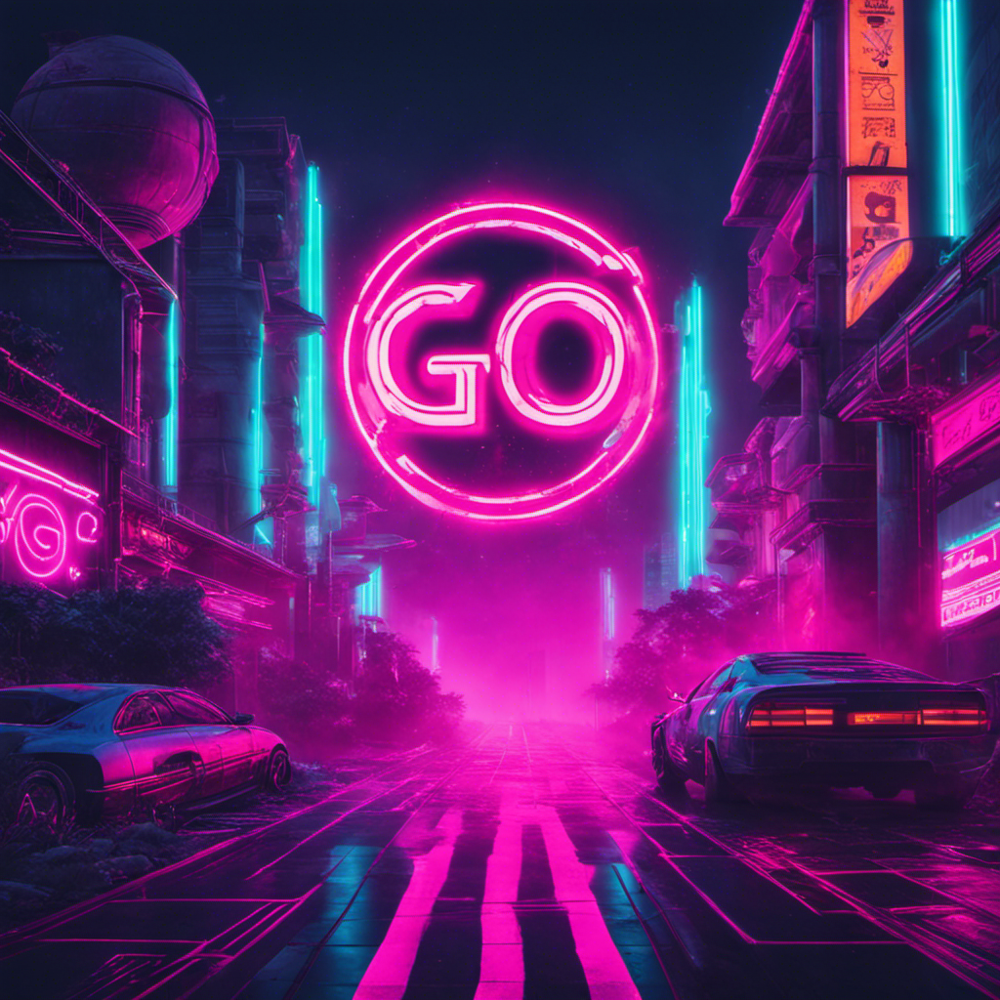

In [28]:
text = "a sign that says go"

response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/text-to-image",
    headers={
        "Content-Type": "application/json",
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    json={
    "text_prompts": [
        {
            "text": text
        }
    ],
        "seed": 191,
        "height": 1024,
        "width": 1024,
        "style_preset": "neon-punk",
        "cfg_scale": 10

    },
)


decode_and_show(response)

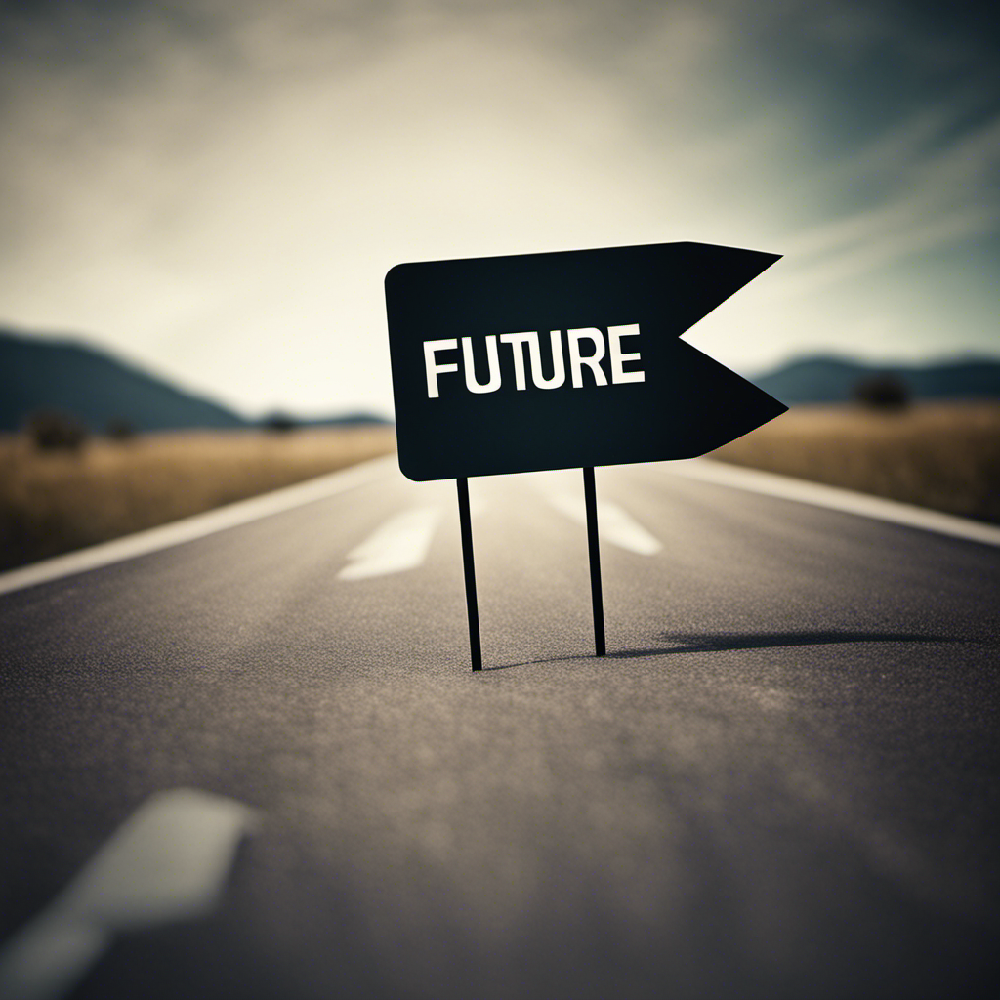

In [27]:
text = "an arrow with a sign that says FUTURE"

response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/text-to-image",
    headers={
        "Content-Type": "application/json",
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    json={
    "text_prompts": [
        {
            "text": text
        }
    ],
        "seed": 141,
        "height": 1024,
        "width": 1024,
        "style_preset": "cinematic",
        "cfg_scale": 10

    },
)


decode_and_show(response)

## <a id='toc4_4_'></a>[D: Image to image](#toc0_)

To perform inference that takes an image as input, you must pass the image into `init_image`.

For the REST API, images don't need to be encoded: just submit the file.

Like output images, input images must be one of the supported resolutions: i.e. (height, width) should be one of (1024, 1024), (1152, 896), (896, 1152), (1216, 832), (832, 1216), (1344, 768), (768, 1344), (1536, 640), (640, 1536).

We set `image_strength` to weight the relative importance of the image and the prompt. For the demo, we'll use a [picture of the cat, taken from Wikimedia Commons](https://commons.wikimedia.org/wiki/File:Cat_August_2010-4.jpg), provided along with this notebook.

In [ ]:
! wget https://platform.stability.ai/Cat_August_2010-4.jpg

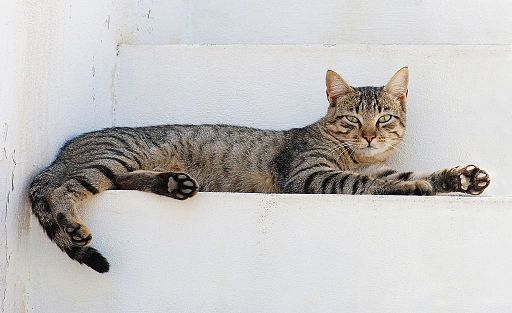

In [31]:
# Here is the original image:
display(Image.open('Cat_August_2010-4.jpg'))

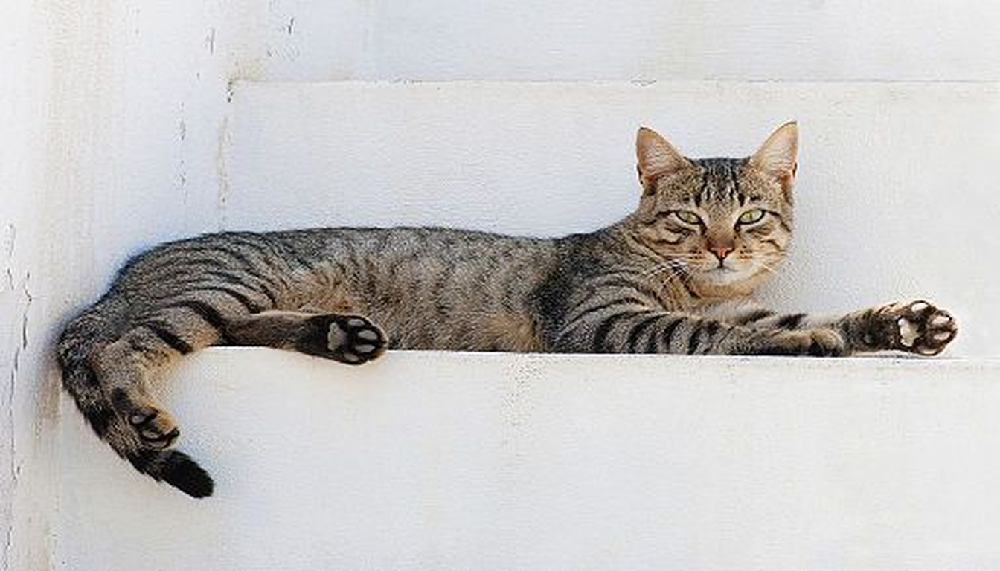

In [33]:
# We will resize this image via cropping, so that it meets the model's requirements on resolution.

im = Image.open('Cat_August_2010-4.jpg')
im1 = im.resize((1344, 768), Image.Resampling.LANCZOS)
im1.save("cat_resized.jpg")

im1

The `image_strength` parameter is a float that determines the relative weighting of the image prompt against the text prompt.

For image-to-image generation, try turning the `image_strength` up. In the example below, compare `image_strength`s 0.3 and 0.9.

At 0.9, the image has lost the sense of 'embroidery', and renders an image that is very close to the input image. 0.7 gives a better balance.

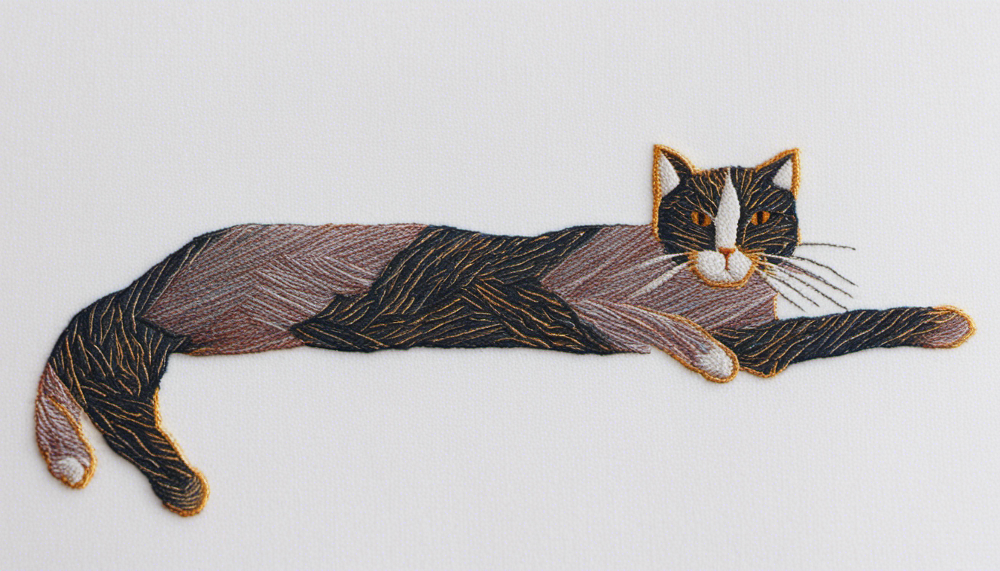

In [40]:
# image strength 0.3 

cat_path = "cat_resized.jpg"

response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/image-to-image",  # Note that the engine-id has changed
    headers={
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    files={
        "init_image": open(cat_path, "rb")
    },
    data={
        "image_strength": 0.3,
        # "init_image_mode": "IMAGE_STRENGTH",
        "text_prompts[0][text]": "cat in embroidery",
        "cfg_scale": 7,
        "samples": 1,
        "steps": 30,
        "seed": 44
    }
)

decode_and_show(response)

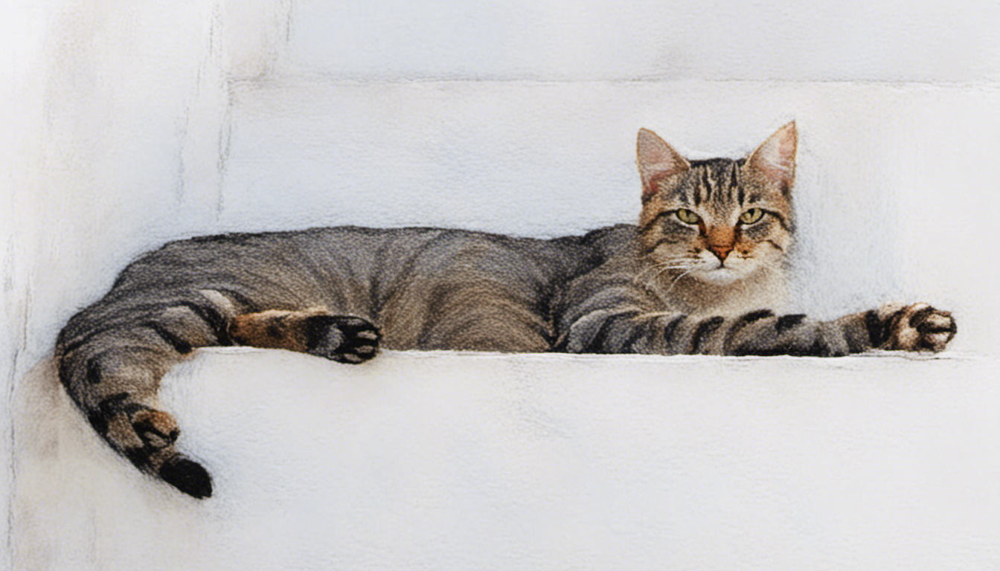

In [41]:
# image strength 0.9

cat_path = "cat_resized.jpg"

### TESTTT this image-to-image
response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/image-to-image",  # Note that the engine-id has changed
    headers={
        "Accept": "application/json",
        "Authorization": f"Bearer {api_key}"
    },
    files={
        "init_image": open(cat_path, "rb")
    },
    data={
        "image_strength": 0.9,
        "init_image_mode": "IMAGE_STRENGTH",
        "text_prompts[0][text]": "cat in embroidery",
        "cfg_scale": 7,
        "samples": 1,
        "steps": 30,
        "seed": 44
    }
)

decode_and_show(response)

## <a id='toc4_5_'></a>[E: Inpainting](#toc0_)

Inpainting is a powerful image-to-image technique that allows you to selectively edit and re-generate portions of an image.

Indicate the regions you want to update using masking.

Let's start with an image and mask off a section.

Here is a woman wearing a scarf. Let's update the colour and texture of the scarf.

In [ ]:
! wget https://platform.stability.ai/scarf_input.jpg
! wget https://platform.stability.ai/scarf_mask_only_bw.png

# display(Image.open('scarf_input.jpg'))
# display(Image.open('scarf_mask_only_bw.png'))

To perform inpainting, you submit two input images: the image to be updated, and the mask indicating the areas to be focussed on.

In [ ]:
scarf_data = encode_image("scarf.jpg") 
mask_data = encode_image("scarf_mask_only_wb.png")
engine_id = "stable-diffusion-xl-1024-v1-0"


response = requests.post(
    f"{api_host}/v1/generation/{engine_id}/image-to-image/masking",
    headers={
        "Accept": 'application/json',
        "Authorization": f"Bearer {api_key}"
    },
    files={
        "init_image": open("scarf.jpg", "rb"),
         "mask_image": open("scarf_mask_only_wb.png", "rb")
    },
    data={
        "mask_source": "MASK_IMAGE_BLACK",
        "text_prompts[0][text]": "A woman wearing a woollen scarf",
        "cfg_scale": 7,
        "samples": 1,
        "steps": 30,
    }
)

decode_and_show(response)

# Next steps

If you are an AWS user, consider deploying SDXL in your own VPC using AWS Jumpstart: https://aws.amazon.com/blogs/machine-learning/use-stable-diffusion-xl-with-amazon-sagemaker-jumpstart-in-amazon-sagemaker-studio/

From September 29th 2023, Use SDXL directly on AWS Bedrock.